# Extracting Text from Images in Python

https://www.kaggle.com/code/robikscube/extracting-text-from-images-youtube-tutorial

<img src="https://media.arxiv-vanity.com/render-output/6158804/images/fig_2_no_trademarks.png" alt="text to images" width="600" height="600">

In [46]:
import pandas as pd
import numpy as np

from glob import glob
# from tqdm.notebook import tqdm
from tqdm import tqdm

import matplotlib.pyplot as plt
from PIL import Image

plt.style.use('ggplot')

# Outline
1. Take a look at the data
2. Extract text from images:
    - pytesseract
    - easyocr
    - keras_ocr
3. Run on a few examples and compare the results

In [2]:
annot = pd.read_parquet('train_val_images/annot.parquet')
imgs = pd.read_parquet('train_val_images/img.parquet')
img_fns = glob('train_val_images/train_images/*')

In [3]:
annot.head(5)

,id,image_id,bbox,utf8_string,points,area
0,a4ea732cd3d5948a_1,a4ea732cd3d5948a,"[525.83, 3.4, 197.64, 33.94]",Performance,"[525.83, 3.4, 723.47, 7.29, 722.76, 36.99, 525...",6707.90
1,a4ea732cd3d5948a_2,a4ea732cd3d5948a,"[534.67, 64.68, 91.22, 38.19]",Sport,"[535.73, 64.68, 623.41, 67.51, 625.89, 102.87,...",3483.69
2,a4ea732cd3d5948a_3,a4ea732cd3d5948a,"[626.95, 63.62, 96.52, 31.82]",Watch,"[626.95, 63.62, 721.7, 63.62, 723.47, 95.44, 6...",3071.27
3,a4ea732cd3d5948a_4,a4ea732cd3d5948a,"[577.4, 141.87, 147.13, 43.1]",...period.,"[580.02, 143.61, 724.53, 141.87, 723.66, 184.9...",6341.30
4,a4ea732cd3d5948a_5,a4ea732cd3d5948a,"[391.03, 163.9, 60.82, 38.65]",.,"[395.2, 163.9, 451.85, 191.94, 445.59, 202.55,...",2350.69


# Plot Example Images

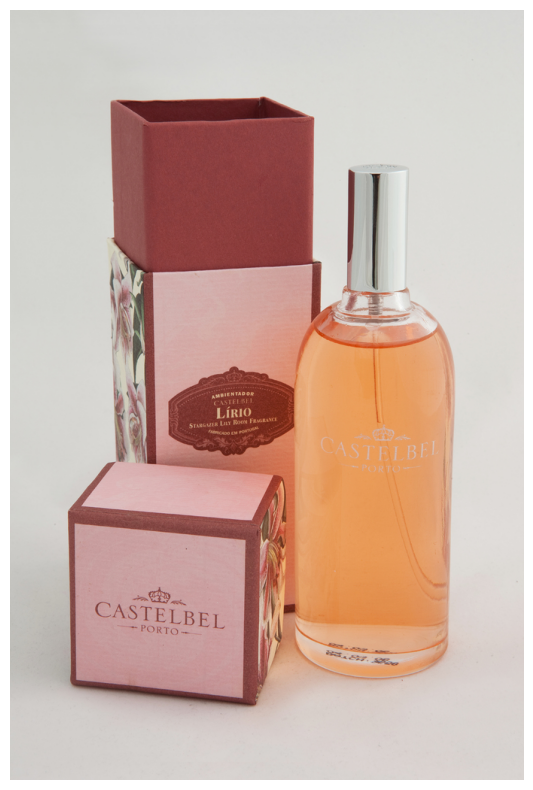

In [4]:
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(plt.imread(img_fns[100]))
ax.axis('off')
plt.show()

In [5]:
image_id = img_fns[100].split('/')[-1].split('\\')[-1].split('.')[0]
annot[annot["image_id"] == image_id]

,id,image_id,bbox,utf8_string,points,area
453742,0023199523656671_1,0023199523656671,"[266.38, 504.88, 59.06, 13.67]",AMBIENTADOR,"[266.38, 508.91, 324.92, 504.88, 325.44, 514.5...",807.35
453743,0023199523656671_2,0023199523656671,"[269.89, 514.17, 55.2, 13.32]",CASTELBEL,"[269.89, 517.85, 325.09, 514.17, 325.09, 523.4...",735.26
453744,0023199523656671_3,0023199523656671,"[273.39, 525.73, 48.02, 18.41]",.,"[273.57, 526.96, 321.41, 525.73, 321.41, 541.6...",884.05
453745,0023199523656671_4,0023199523656671,"[236.77, 546.24, 40.48, 10.86]",STARGAZER,"[236.77, 548.52, 276.9, 546.24, 277.25, 554.48...",439.61
453746,0023199523656671_5,0023199523656671,"[278.83, 544.66, 16.29, 8.94]",LILY,"[278.83, 545.19, 294.95, 544.66, 295.12, 553.0...",145.63
453747,0023199523656671_6,0023199523656671,"[296.18, 543.43, 19.97, 8.94]",ROOM,"[296.18, 544.31, 315.8, 543.43, 316.15, 551.5,...",178.53
453748,0023199523656671_7,0023199523656671,"[318.26, 540.46, 37.68, 9.81]",FRAGTANCE,"[318.26, 542.21, 355.94, 540.46, 355.94, 548.8...",369.64
453749,0023199523656671_8,0023199523656671,"[262.18, 557.1, 30.49, 9.64]",FABRICADO,"[262.7, 557.1, 292.67, 559.21, 292.67, 566.74,...",293.92
453750,0023199523656671_9,0023199523656671,"[293.37, 559.73, 9.99, 5.61]",EM,"[293.37, 559.73, 303.36, 559.73, 303.36, 565.1...",56.04
453751,0023199523656671_10,0023199523656671,"[303.36, 551.5, 28.39, 13.67]",PORTUGAL,"[303.36, 559.03, 330.53, 551.5, 331.75, 557.28...",388.09


## Display for first 25 images

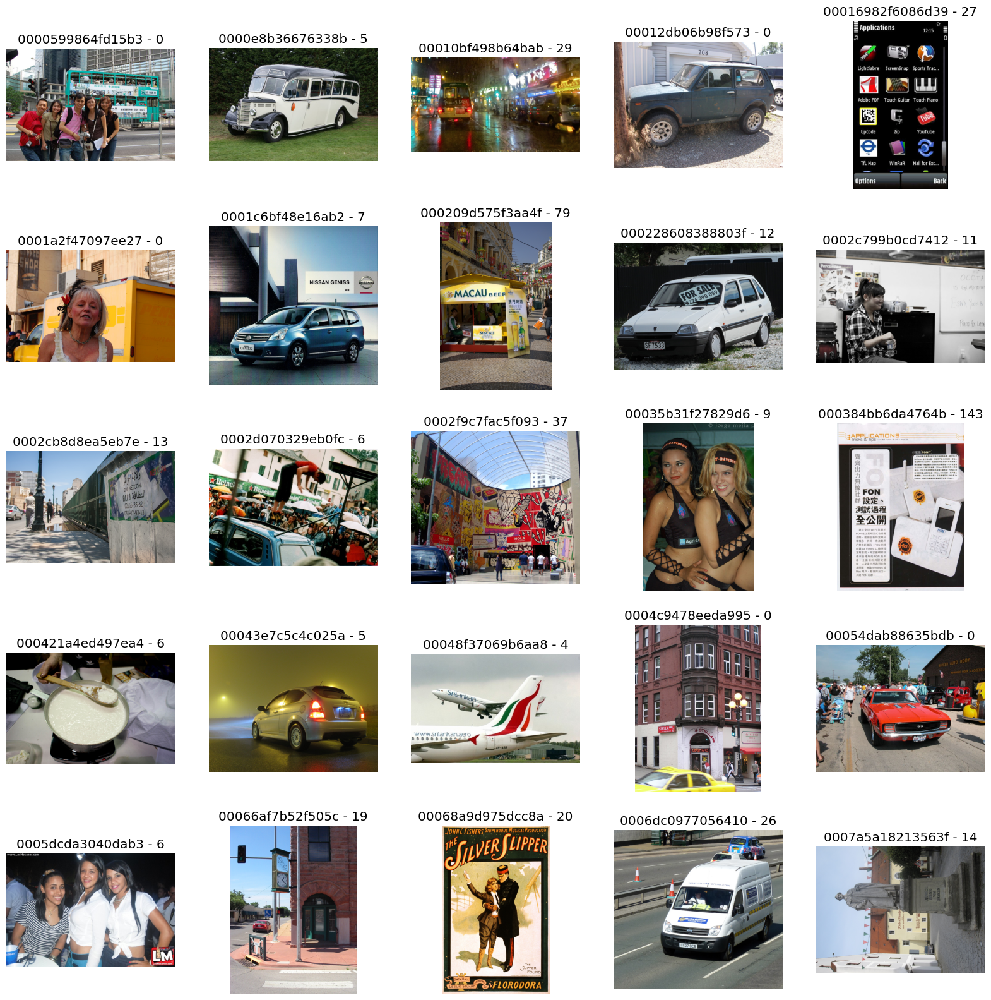

In [6]:
fig, axs = plt.subplots(5, 5, figsize=(20, 20))
axs = axs.flatten()
for i in range(25):
    axs[i].imshow(plt.imread(img_fns[i]))
    axs[i].axis('off')
    image_id = img_fns[i].split('/')[-1].split('\\')[-1].split('.')[0]
    n_annot = len(annot.query('image_id == @image_id'))
    axs[i].set_title(f'{image_id} - {n_annot}')
plt.show()

# Method 1: pytesseract

In [12]:
from pytesseract import pytesseract

# Example call
pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract'

print(pytesseract.image_to_string(img_fns[100], lang='eng'))

ae
CASTELBEL

7aEEORTO =




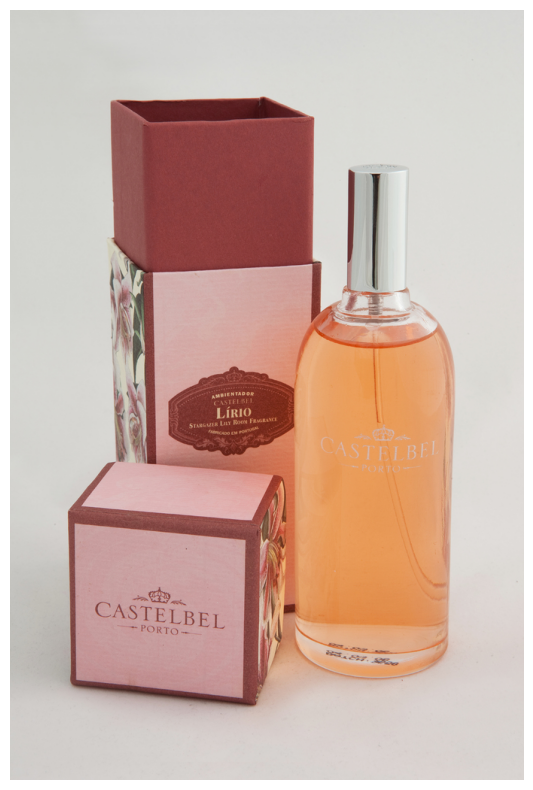

In [14]:
fig, ax = plt.subplots(figsize=(10,10))
ax.imshow(plt.imread(img_fns[100]))
ax.axis('off')
plt.show()

# Method 2: easyocr

In [16]:
import easyocr

reader = easyocr.Reader(['en'], gpu = False)

Using CPU. Note: This module is much faster with a GPU.


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [18]:
results = reader.readtext(img_fns[100])

In [19]:
pd.DataFrame(results, columns=['bbox','text','conf'])

,bbox,text,conf
0,"[[270, 508], [324, 508], [324, 516], [270, 516]]",l@icmucdon,0.021254
1,"[[268, 513], [319, 513], [319, 528], [268, 528]]",CSTEL BBE,0.065916
2,"[[269, 523], [356, 523], [356, 552], [269, 552]]",LiRIO zunssa,0.115677
3,"[[278, 544], [316, 544], [316, 552], [278, 552]]",J Romni,0.026497
4,"[[262, 558], [302, 558], [302, 566], [262, 566]]",Weadou,0.013847
5,"[[408, 564], [577, 564], [577, 609], [408, 609]]",CAST ALBEL,0.273807
6,"[[465, 603], [523, 603], [523, 619], [465, 619]]",,0.000000
7,"[[108, 779], [294, 779], [294, 831], [108, 831]]",CASTELBEL,0.997948
8,"[[438, 854], [477, 854], [477, 868], [438, 868]]",4X,0.096515
9,"[[236.07152330911475, 549.628609323646], [275....",natn,0.268314


# Method 3: keras_ocr

In [29]:
import keras_ocr

pipeline = keras_ocr.pipeline.Pipeline()

Looking for C:\Users\DLafeuille\.keras-ocr\craft_mlt_25k.h5
Looking for C:\Users\DLafeuille\.keras-ocr\crnn_kurapan.h5


In [30]:
results = pipeline.recognize([img_fns[100]])

1/1 [==============================] - 4s 4s/step


In [31]:
pd.DataFrame(results[0], columns=['text', 'bbox'])

,text,bbox
0,mneniad,"[[268.35645, 510.5644], [313.802, 506.01984], ..."
1,ok,"[[314.0, 507.0], [325.0, 507.0], [325.0, 514.0..."
2,castelbel,"[[269.53696, 517.59143], [323.88718, 514.1946]..."
3,lirio,"[[274.0, 528.0], [323.0, 528.0], [323.0, 545.0..."
4,frara,"[[317.64133, 543.0824], [355.92496, 540.7622],..."
5,root,"[[297.0, 545.0], [317.0, 545.0], [317.0, 552.0..."
6,lind,"[[279.0, 547.0], [295.0, 547.0], [295.0, 554.0..."
7,ie,"[[261.0, 548.0], [277.0, 548.0], [277.0, 555.0..."
8,stare,"[[238.0, 549.0], [261.0, 549.0], [261.0, 557.0..."
9,cotnen,"[[303.81964, 558.98364], [330.68524, 552.66235..."


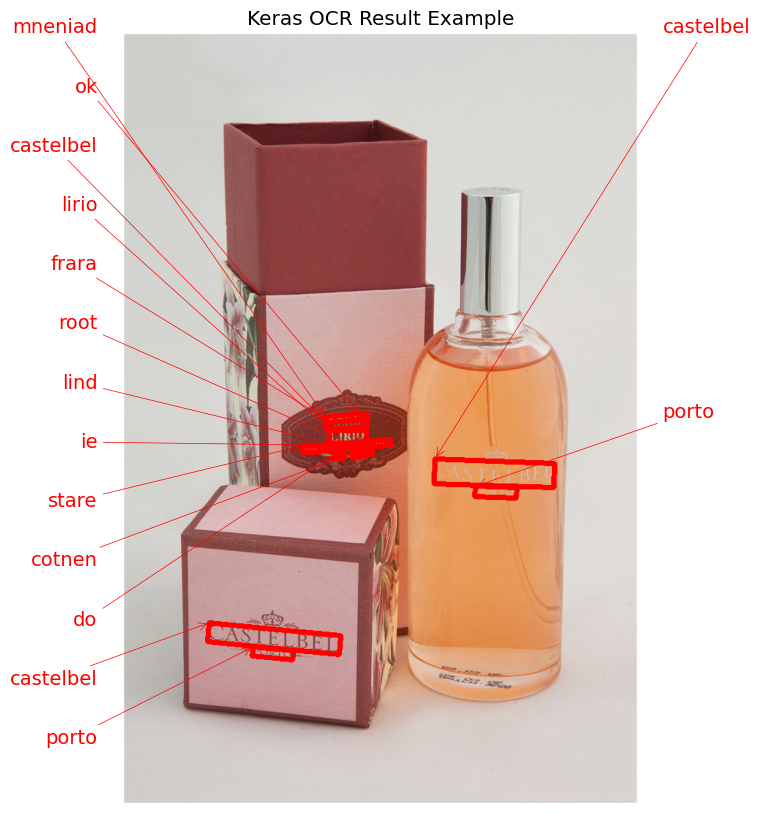

In [33]:
fig, ax = plt.subplots(figsize=(10, 10))
keras_ocr.tools.drawAnnotations(plt.imread(img_fns[100]), results[0], ax=ax)
ax.set_title('Keras OCR Result Example')
plt.show()

# Compare easyocr vs. keras_ocr

In [48]:
# easyocr
reader = easyocr.Reader(['en'], gpu = False)

dfs = []
for img in tqdm(img_fns[:10]):
    result = reader.readtext(img)
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['bbox','text','conf'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

Using CPU. Note: This module is much faster with a GPU.
100%|██████████| 10/10 [00:47<00:00,  4.76s/it]


In [49]:
# keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()

dfs = []
for img in tqdm(img_fns[:10]):
    results = pipeline.recognize([img])
    result = results[0]
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['text', 'bbox'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
kerasocr_df = pd.concat(dfs)

Looking for C:\Users\DLafeuille\.keras-ocr\craft_mlt_25k.h5
Looking for C:\Users\DLafeuille\.keras-ocr\crnn_kurapan.h5


  0%|          | 0/10 [00:00<?, ?it/s]

1/1 [==============================] - 3s 3s/step


 10%|█         | 1/10 [00:16<02:28, 16.54s/it]

1/1 [==============================] - 0s 426ms/step


 20%|██        | 2/10 [00:35<02:23, 17.99s/it]

1/1 [==============================] - 0s 335ms/step


 30%|███       | 3/10 [00:48<01:50, 15.84s/it]

1/1 [==============================] - 0s 488ms/step


 40%|████      | 4/10 [01:06<01:39, 16.59s/it]

1/1 [==============================] - 3s 3s/step


 50%|█████     | 5/10 [01:21<01:20, 16.09s/it]

1/1 [==============================] - 0s 339ms/step


 60%|██████    | 6/10 [01:36<01:02, 15.54s/it]

1/1 [==============================] - 1s 562ms/step


 70%|███████   | 7/10 [01:56<00:51, 17.13s/it]

1/1 [==============================] - 2s 2s/step


 80%|████████  | 8/10 [02:12<00:33, 16.84s/it]

1/1 [==============================] - 1s 545ms/step


 90%|█████████ | 9/10 [02:29<00:16, 16.73s/it]

1/1 [==============================] - 1s 945ms/step


100%|██████████| 10/10 [02:44<00:00, 16.45s/it]


# Plot Results: easyocr vs keras_ocr

In [50]:
def plot_compare(img_fn, easyocr_df, kerasocr_df):
    img_id = img_fn.split('/')[-1].split('.')[0]
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    easy_results = easyocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    easy_results = [(x[0], np.array(x[1])) for x in easy_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    easy_results, ax=axs[0])
    axs[0].set_title('easyocr results', fontsize=24)

    keras_results = kerasocr_df.query('img_id == @img_id')[['text','bbox']].values.tolist()
    keras_results = [(x[0], np.array(x[1])) for x in keras_results]
    keras_ocr.tools.drawAnnotations(plt.imread(img_fn), 
                                    keras_results, ax=axs[1])
    axs[1].set_title('keras_ocr results', fontsize=24)
    plt.show()

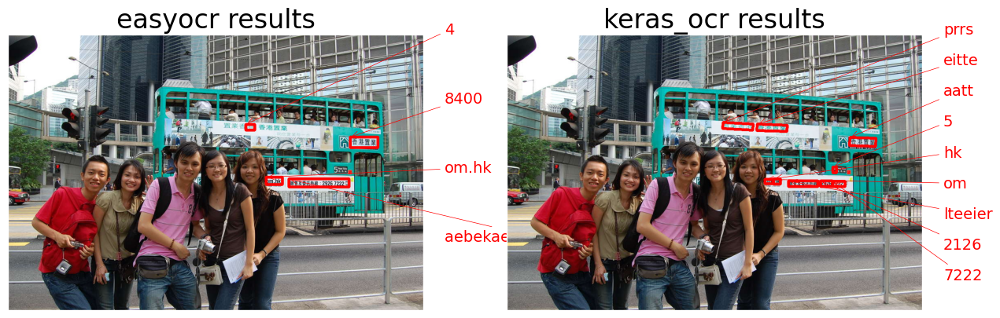

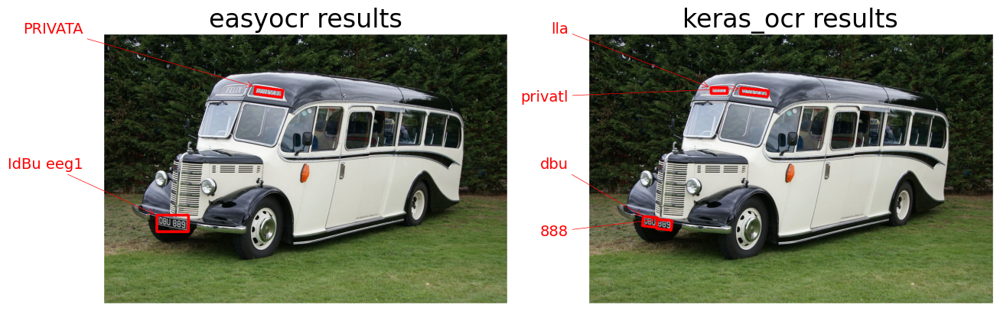

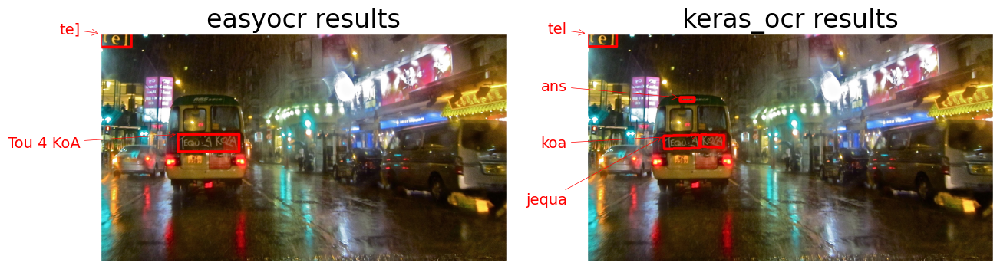

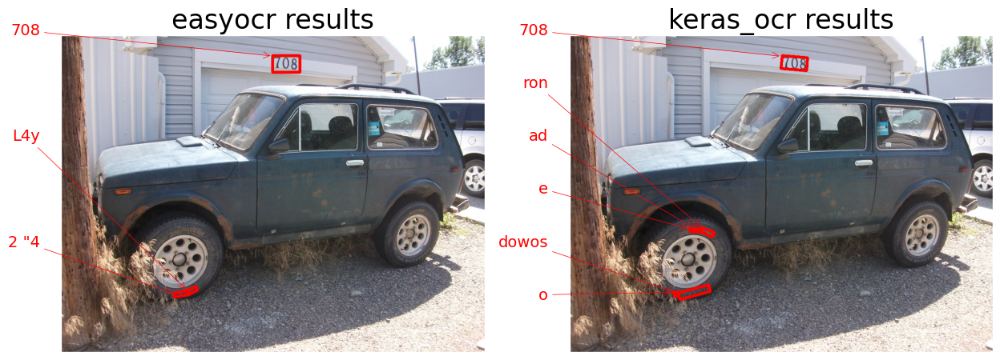

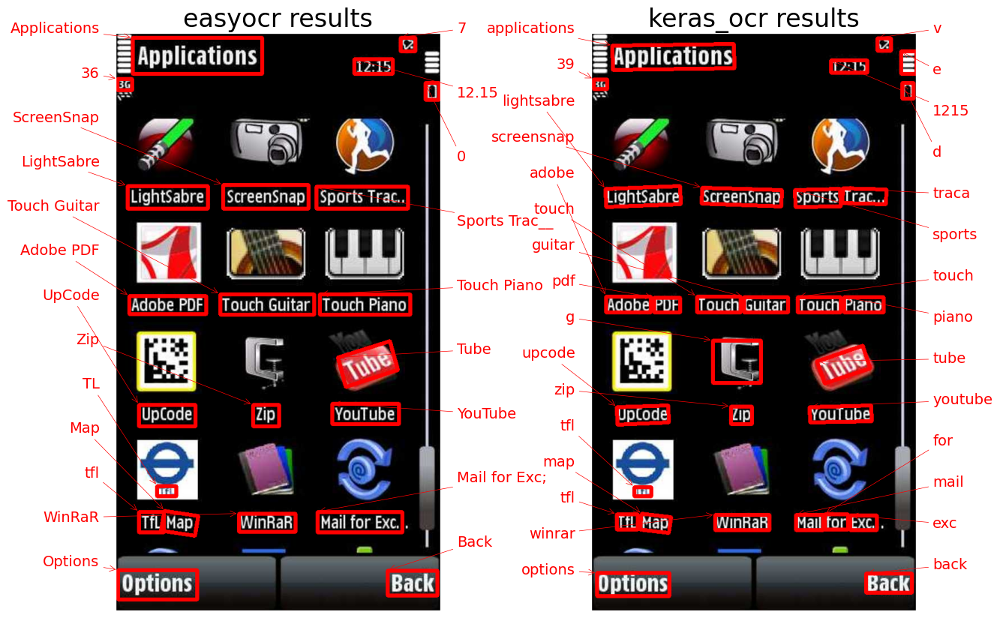

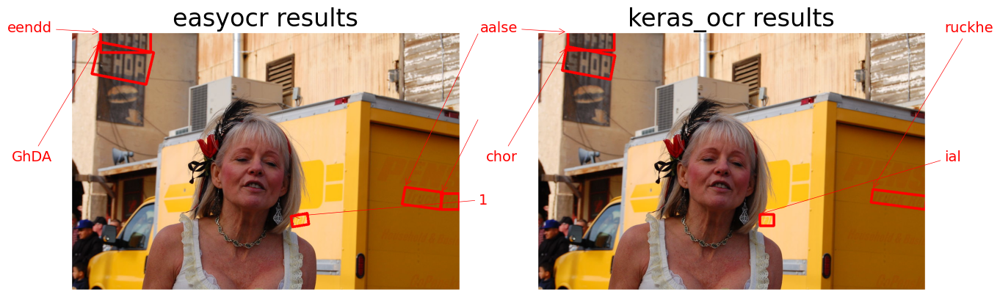

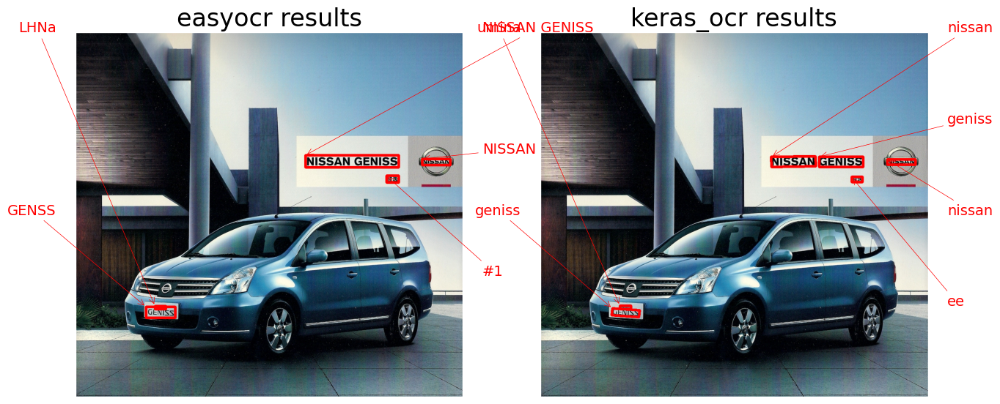

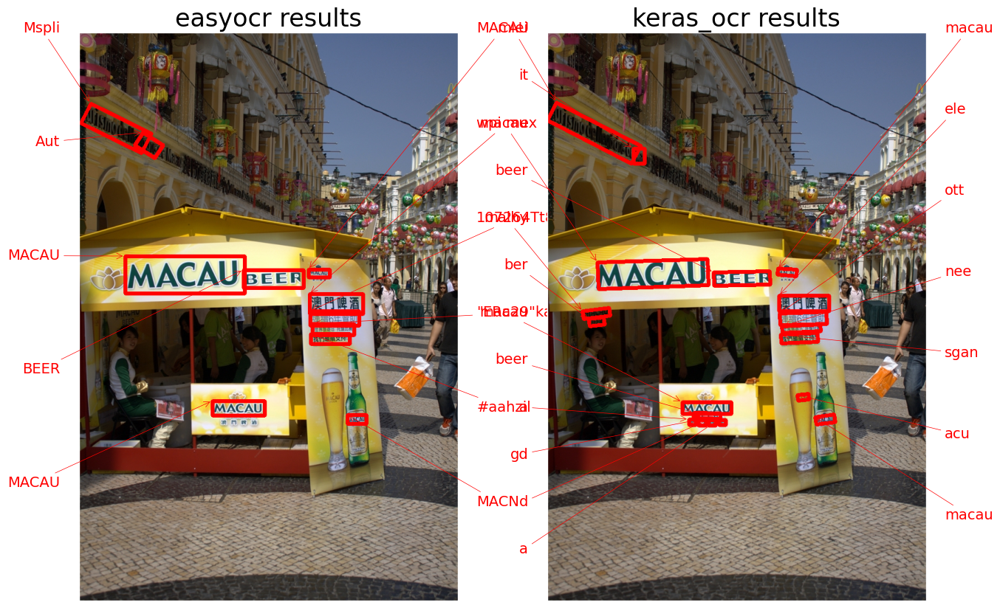

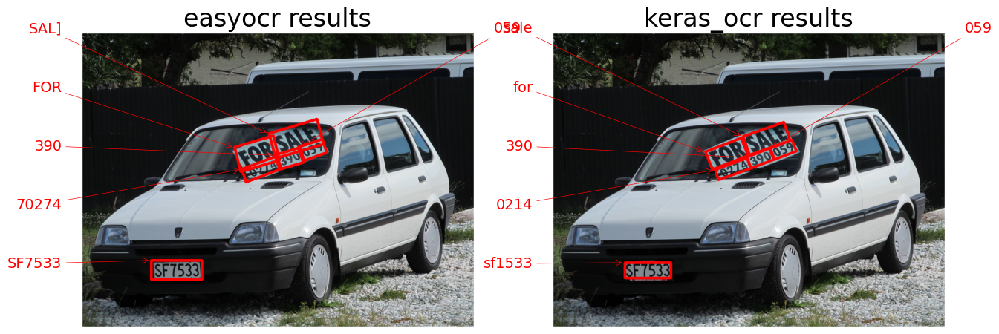

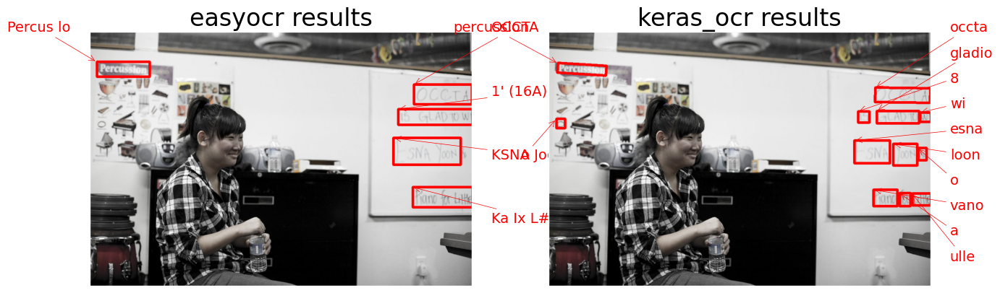

In [53]:
# Loop over results
for img_fn in img_fns[:10]:
    plot_compare(img_fn, easyocr_df, kerasocr_df)

Using CPU. Note: This module is much faster with a GPU.
100%|██████████| 6/6 [01:35<00:00, 15.84s/it]


Looking for C:\Users\DLafeuille\.keras-ocr\craft_mlt_25k.h5
Looking for C:\Users\DLafeuille\.keras-ocr\crnn_kurapan.h5


  0%|          | 0/6 [00:00<?, ?it/s]

7/7 [==============================] - 19s 2s/step


 17%|█▋        | 1/6 [00:30<02:33, 30.67s/it]

1/1 [==============================] - 1s 913ms/step


 33%|███▎      | 2/6 [00:33<00:58, 14.56s/it]

2/2 [==============================] - 5s 2s/step


 50%|█████     | 3/6 [00:45<00:39, 13.20s/it]

8/8 [==============================] - 23s 3s/step


 67%|██████▋   | 4/6 [01:19<00:42, 21.36s/it]

3/3 [==============================] - 6s 2s/step


 83%|████████▎ | 5/6 [01:37<00:20, 20.21s/it]

8/8 [==============================] - 22s 3s/step


100%|██████████| 6/6 [02:12<00:00, 22.13s/it]


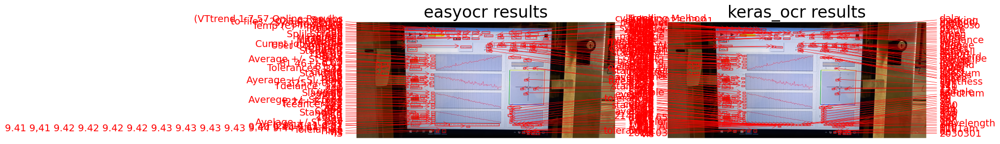

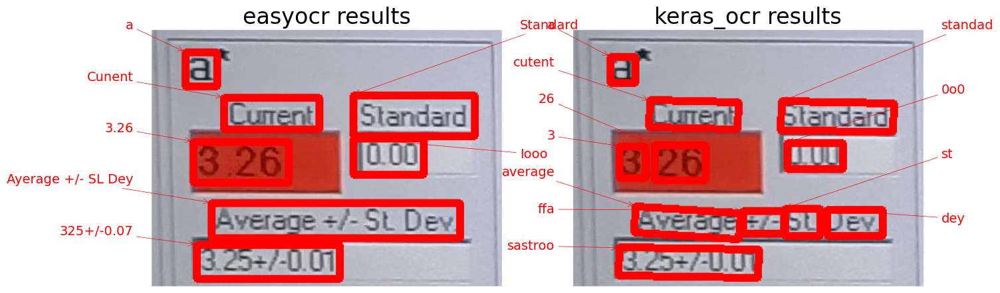

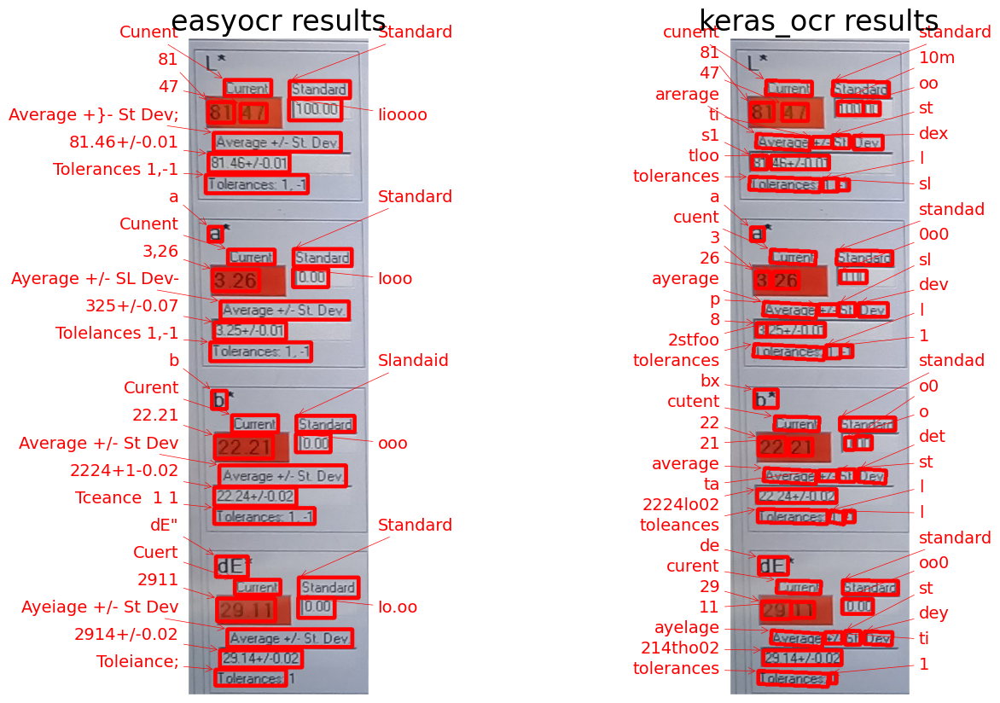

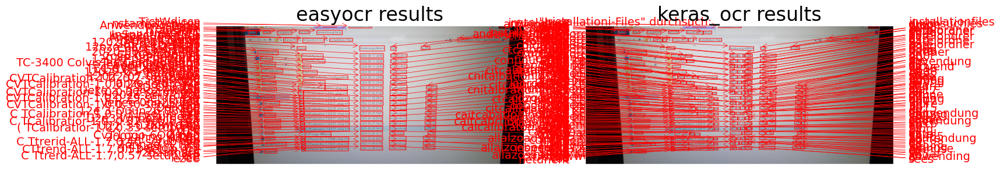

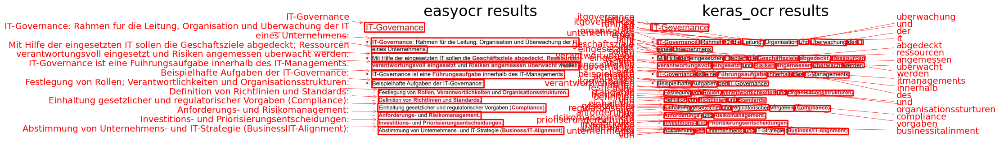

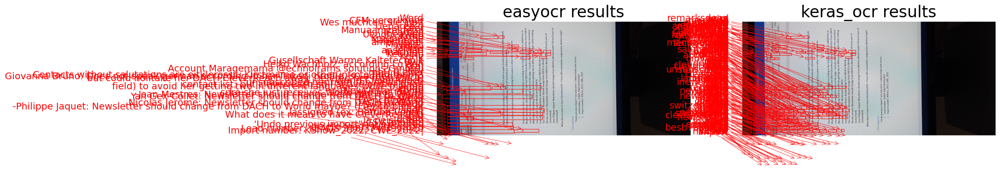

In [54]:
# Loop over results
imgs = glob('images/*')

# easyocr
reader = easyocr.Reader(['en'], gpu = False)
dfs = []
for img in tqdm(imgs):
    result = reader.readtext(img)
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['bbox','text','conf'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
easyocr_df = pd.concat(dfs)

# keras_ocr
pipeline = keras_ocr.pipeline.Pipeline()

dfs = []
for img in tqdm(imgs):
    results = pipeline.recognize([img])
    result = results[0]
    img_id = img.split('/')[-1].split('.')[0]
    img_df = pd.DataFrame(result, columns=['text', 'bbox'])
    img_df['img_id'] = img_id
    dfs.append(img_df)
kerasocr_df = pd.concat(dfs)

for img in imgs:
    plot_compare(img, easyocr_df, kerasocr_df)